In [1]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import KFold
from tensorflow.keras import layers
import pandas as pd
from sklearn.metrics import roc_auc_score

tf.random.set_seed(1234)


In [3]:
print(tf.__version__)

2.5.0


In [4]:
DATASET_SIZE = 234
data_dir_ap = '/content/gdrive/MyDrive/compound_img2/AP/'
data_dir_L = '/content/gdrive/MyDrive/compound_img2/L/'


ap_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_ap,
  seed=42)

L_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_L,
  seed=42)

Found 234 files belonging to 2 classes.
Found 234 files belonging to 2 classes.


In [5]:
size = (150, 150)
ap_ds = ap_ds.map(lambda x, y: (tf.image.resize(x, size), y))
L_ds = L_ds.map(lambda x, y: (tf.image.resize(x, size), y))

In [6]:
x_ap = np.empty([1, 150, 150, 3])
y_ap = []
for x,y in ap_ds:
  x_ap = np.concatenate((x_ap, x), axis=0)
  y_ap = np.concatenate([y_ap, y], axis=0)

x_ap = x_ap[1:, :,:,:]

x_L = np.empty([1, 150, 150, 3])
y_L = []
for x,y in L_ds:
  x_L = np.concatenate((x_L, x), axis=0)
  y_L = np.concatenate([y_L, y], axis=0)

x_L = x_L[1:, :,:,:]

print(x_ap.shape)
print(x_L.shape)

(234, 150, 150, 3)
(234, 150, 150, 3)


In [7]:
#Ensure that the images are ordered the same way between the AP and L splits
print(y_L - y_ap)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


In [8]:
# Load weights pre-trained on ImageNet.
# Do not include the ImageNet classifier at the top.

base_model_ap = keras.applications.InceptionResNetV2(
    weights="imagenet",  
    input_shape=(150, 150, 3),
    include_top=False,
)  

base_model_L = keras.applications.InceptionResNetV2(
    weights="imagenet",  
    input_shape=(150, 150, 3),
    include_top=False,
) 

219062272/219055592 [==============================] - 2s 0us/step


In [9]:
data_augmentation_ap = keras.Sequential(
    [
        layers .experimental.preprocessing.RandomFlip("horizontal"), #L -> R flip
        layers.experimental.preprocessing.RandomRotation(0.05),
    ]
)

data_augmentation_L = keras.Sequential(
    [
        layers.experimental.preprocessing.RandomFlip("horizontal"), #L -> R flip
        layers.experimental.preprocessing.RandomRotation(0.05),
    ]
)

In [21]:
accscores = []
aucscores = []
raw_preds = []
gts_ap = np.empty((234,))
predictions_ap = np.empty((234,1))

for kfold, (train, test) in enumerate(KFold(n_splits=5, shuffle=True).split(x_ap, y_ap)):
  tf.keras.backend.clear_session()

  base_model_ap = keras.applications.InceptionResNetV2(
      weights="imagenet",  
      input_shape=(150, 150, 3),
      include_top=False,
  )  
  
  base_model_ap.trainable = False
  base_model_ap._name="AP-View-Model"

  inputs_ap = keras.Input(shape=(150, 150, 3) ,name= "ap_input")
  
  augmented_ap = data_augmentation_ap(inputs_ap)  

  norm_layer_ap = keras.layers.experimental.preprocessing.Normalization()
  mean = np.array([127.5] * 3)
  var = mean ** 2
  augmented_ap = norm_layer_ap(augmented_ap)
  norm_layer_ap.set_weights([mean, var])

  augmented_ap = base_model_ap(augmented_ap, training=False)

  augmented_ap = keras.layers.GlobalAveragePooling2D()(augmented_ap)
  augmented_ap = keras.layers.Dropout(0.2)(augmented_ap)  # Regularize with dropout
  output_ap = keras.layers.Dense(1, activation='sigmoid')(augmented_ap)

  model_ap = keras.Model(inputs_ap, output_ap)
  #-----------Model is now defined, moving on to training---------

  callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)

  model_ap.compile(
      optimizer=keras.optimizers.Adam(),
      loss=keras.losses.BinaryCrossentropy(from_logits=True),
      metrics=[keras.metrics.BinaryAccuracy(), keras.metrics.AUC()],
  )

  epochs = 200

  #First fit with frozen weights
  model_ap.fit(x_ap[train], y=y_ap[train], epochs=epochs, callbacks=[callback], validation_split=0.2)

  base_model_ap.trainable = True

  model_ap.compile(
    optimizer=keras.optimizers.Adam(1e-5),  # Low learning rate
    loss=keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=[keras.metrics.BinaryAccuracy(), keras.metrics.AUC()],
  ) 

  epochs = 40

  #Second fit
  model_ap.fit(x_ap[train], y=y_ap[train], epochs=epochs, callbacks=[callback], validation_split=0.2)

  #Evaluate
  predictions_ap[test] = model_ap.predict(x_ap[test])
  gts_ap[test] = y_ap[test]
  scores = model_ap.evaluate(x_ap[test], y=y_ap[test])


  print("%s: %.2f%%" % (model_ap.metrics_names[0], scores[0]*100))
  accscores.append(scores[1] * 100)
  aucscores.append(scores[2])
 
print("%.2f%% (+/- %.2f%%)" % (np.mean(accscores), np.std(accscores)))
print("%.2f%% (+/- %.2f%%)" % (np.mean(aucscores), np.std(aucscores)))

Epoch 1/200


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:5017: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  '"`binary_crossentropy` received `from_logits=True`, but the `output`'


5/5 [==============================] - 15s 925ms/step - loss: 0.7552 - binary_accuracy: 0.6174 - auc: 0.6179 - val_loss: 0.5374 - val_binary_accuracy: 0.7368 - val_auc: 0.7926
Epoch 2/200
5/5 [==============================] - 1s 126ms/step - loss: 0.7292 - binary_accuracy: 0.5973 - auc: 0.6347 - val_loss: 0.5104 - val_binary_accuracy: 0.7895 - val_auc: 0.8338
Epoch 3/200
5/5 [==============================] - 1s 120ms/step - loss: 0.6426 - binary_accuracy: 0.6779 - auc: 0.7122 - val_loss: 0.4874 - val_binary_accuracy: 0.8158 - val_auc: 0.8608
Epoch 4/200
5/5 [==============================] - 1s 120ms/step - loss: 0.5730 - binary_accuracy: 0.6779 - auc: 0.7662 - val_loss: 0.4929 - val_binary_accuracy: 0.7895 - val_auc: 0.8807
Epoch 5/200
5/5 [==============================] - 1s 119ms/step - loss: 0.5274 - binary_accuracy: 0.6711 - auc: 0.8067 - val_loss: 0.4550 - val_binary_accuracy: 0.8684 - val_auc: 0.8807
Epoch 6/200
5/5 [==============================] - 1s 127ms/step - loss: 0.5

In [23]:
auc = roc_auc_score(gts_ap, predictions_ap)
print(auc)

0.8686600221483942


In [28]:
accscores = []
aucscores = []
raw_preds = []
gts_L = np.empty((234,))
predictions_L = np.empty((234,1))

for kfold, (train, test) in enumerate(KFold(n_splits=5, shuffle=True).split(x_L, y_L)):
  tf.keras.backend.clear_session()

  base_model_L = keras.applications.InceptionResNetV2(
    weights="imagenet",  
    input_shape=(150, 150, 3),
    include_top=False,
  ) 


  base_model_L.trainable = False
  base_model_L._name="L-Model"

  inputs_L = keras.Input(shape=(150, 150, 3), name="L_input")
  augmented_L = data_augmentation_L(inputs_L)  

  norm_layer_L = keras.layers.experimental.preprocessing.Normalization()
  mean = np.array([127.5] * 3)
  var = mean ** 2
  augmented_L = norm_layer_L(augmented_L)
  norm_layer_L.set_weights([mean, var])
  augmented_L = base_model_L(augmented_L, training=False)


  augmented_L = keras.layers.GlobalAveragePooling2D()(augmented_L)
  augmented_L = keras.layers.Dropout(0.2)(augmented_L)  # Regularize with dropout
  output_L = keras.layers.Dense(1, activation='sigmoid')(augmented_L)
  model_L = keras.Model(inputs_L, output_L)

  #-----------Model is now defined, moving on to training---------

  callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)

  model_L.compile(
      optimizer=keras.optimizers.Adam(),
      loss=keras.losses.BinaryCrossentropy(from_logits=True),
      metrics=[keras.metrics.BinaryAccuracy(), keras.metrics.AUC()],
  )

  epochs = 200

  #First fit with frozen weights
  model_L.fit(x_L[train], y=y_L[train], epochs=epochs, callbacks=[callback], validation_split=0.2)

  base_model_L.trainable = True

  model_L.compile(
      optimizer=keras.optimizers.Adam(1e-5),  # Lower learning rate
      loss=keras.losses.BinaryCrossentropy(from_logits=True),
      metrics=[keras.metrics.BinaryAccuracy(), keras.metrics.AUC()],
  )

  epochs = 40

  #Second fit
  model_L.fit(x_L[train], y=y_L[train], epochs=epochs, callbacks=[callback], validation_split=0.2)

  #Evaluate
  predictions_L[test] = model_L.predict(x_L[test])
  gts_L[test] = y_L[test]
  scores = model_L.evaluate(x_L[test], y=y_L[test])


  print("%s: %.2f%%" % (model_L.metrics_names[0], scores[0]*100))
  accscores.append(scores[1] * 100)
  aucscores.append(scores[2])
 
print("%.2f%% (+/- %.2f%%)" % (np.mean(accscores), np.std(accscores)))
print("%.2f%% (+/- %.2f%%)" % (np.mean(aucscores), np.std(aucscores)))

Epoch 1/200


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:5017: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  '"`binary_crossentropy` received `from_logits=True`, but the `output`'


5/5 [==============================] - 12s 872ms/step - loss: 0.9341 - binary_accuracy: 0.4698 - auc: 0.4244 - val_loss: 0.8171 - val_binary_accuracy: 0.4737 - val_auc: 0.6134
Epoch 2/200
5/5 [==============================] - 1s 130ms/step - loss: 0.7614 - binary_accuracy: 0.5570 - auc: 0.5551 - val_loss: 0.6703 - val_binary_accuracy: 0.5789 - val_auc: 0.6653
Epoch 3/200
5/5 [==============================] - 1s 119ms/step - loss: 0.7075 - binary_accuracy: 0.6107 - auc: 0.6511 - val_loss: 0.6555 - val_binary_accuracy: 0.6316 - val_auc: 0.6919
Epoch 4/200
5/5 [==============================] - 1s 128ms/step - loss: 0.6212 - binary_accuracy: 0.6510 - auc: 0.7307 - val_loss: 0.6801 - val_binary_accuracy: 0.6316 - val_auc: 0.7185
Epoch 5/200
5/5 [==============================] - 1s 120ms/step - loss: 0.5851 - binary_accuracy: 0.6913 - auc: 0.7607 - val_loss: 0.6793 - val_binary_accuracy: 0.6316 - val_auc: 0.7269
Epoch 6/200
5/5 [==============================] - 1s 120ms/step - loss: 0.5

In [29]:
auc = roc_auc_score(gts_L, predictions_L)
print(auc)

0.9170542635658915


In [26]:
accscores = []
aucscores = []
gts_combined = np.empty((234,))
predictions_combined = np.empty((234,1))

for kfold, (train, test) in enumerate(KFold(n_splits=5, shuffle=True).split(x_L, y_L)):

  tf.keras.backend.clear_session()

  base_model_ap = keras.applications.InceptionResNetV2(
      weights="imagenet",  
      input_shape=(150, 150, 3),
      include_top=False,
  ) 

  base_model_ap.trainable = False
  base_model_ap._name="AP-View-Model"

  inputs_ap = keras.Input(shape=(150, 150, 3) ,name= "ap_input")
  
  augmented_ap = data_augmentation_ap(inputs_ap)  

  norm_layer_ap = keras.layers.experimental.preprocessing.Normalization()
  mean = np.array([127.5] * 3)
  var = mean ** 2
  augmented_ap = norm_layer_ap(augmented_ap)
  norm_layer_ap.set_weights([mean, var])

  augmented_ap = base_model_ap(augmented_ap, training=False)

  augmented_ap = keras.layers.GlobalAveragePooling2D()(augmented_ap)
  augmented_ap = keras.layers.Dropout(0.2)(augmented_ap)  # Regularize with dropout

  base_model_L = keras.applications.InceptionResNetV2(
    weights="imagenet",  
    input_shape=(150, 150, 3),
    include_top=False,
  ) 

  base_model_L.trainable = False
  base_model_L._name="L-Model"

  inputs_L = keras.Input(shape=(150, 150, 3), name="L_input")
  augmented_L = data_augmentation_L(inputs_L)  

  norm_layer_L = keras.layers.experimental.preprocessing.Normalization()
  mean = np.array([127.5] * 3)
  var = mean ** 2
  augmented_L = norm_layer_L(augmented_L)
  norm_layer_L.set_weights([mean, var])
  augmented_L = base_model_L(augmented_L, training=False)


  augmented_L = keras.layers.GlobalAveragePooling2D()(augmented_L)
  augmented_L = keras.layers.Dropout(0.2)(augmented_L)  # Regularize with dropout

  cat = layers.concatenate([augmented_L, augmented_ap])
  cat = layers.Flatten()(cat)
  dense = layers.Dense(512)(cat)
  dense = layers.LeakyReLU(alpha=0.1)(dense)
  dense = layers.Dropout(0.5)(dense)
  outputs = layers.Dense(1, activation='sigmoid')(dense)

  model = keras.Model(inputs=[inputs_ap, inputs_L], outputs=outputs,)

  #-----------Model is now defined, moving on to training---------

  callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)

  model.compile(
      optimizer=keras.optimizers.Adam(),
      loss=keras.losses.BinaryCrossentropy(from_logits=True),
      metrics=[keras.metrics.BinaryAccuracy(), keras.metrics.AUC()],
  )

  epochs = 200

  #First fit with frozen weights
  model.fit(x=[x_ap[train], x_L[train]],y=y_ap[train] , callbacks=[callback], epochs=epochs, validation_split=0.2)

  base_model_L.trainable = True
  base_model_ap.trainable = True

  model.compile(
      optimizer=keras.optimizers.Adam(1e-5),  # Low learning rate
      loss=keras.losses.BinaryCrossentropy(from_logits=True),
      metrics=[keras.metrics.BinaryAccuracy(), keras.metrics.AUC()],
  )

  epochs = 40

  #Second fit
  model.fit(x=[x_ap[train], x_L[train]],y=y_ap[train] , callbacks=[callback], epochs=epochs, validation_split=0.2)

  #Evaluate
  predictions_combined[test] = model.predict([x_ap[test], x_L[test]])
  gts_combined[test] = y_L[test]
  scores = model.evaluate(x=[x_ap[test], x_L[test]], y=y_L[test])
  

  print("%s: %.2f%%" % (model_L.metrics_names[0], scores[0]*100))
  accscores.append(scores[1] * 100)
  aucscores.append(scores[2])
 
print("%.2f%% (+/- %.2f%%)" % (np.mean(accscores), np.std(accscores)))
print("%.2f%% (+/- %.2f%%)" % (np.mean(aucscores), np.std(aucscores)))

Epoch 1/200


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:5017: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  '"`binary_crossentropy` received `from_logits=True`, but the `output`'


5/5 [==============================] - 27s 2s/step - loss: 1.9172 - binary_accuracy: 0.5973 - auc: 0.6409 - val_loss: 0.9592 - val_binary_accuracy: 0.5789 - val_auc: 0.7689
Epoch 2/200
5/5 [==============================] - 1s 231ms/step - loss: 0.7867 - binary_accuracy: 0.7248 - auc: 0.8056 - val_loss: 0.6385 - val_binary_accuracy: 0.7105 - val_auc: 0.8403
Epoch 3/200
5/5 [==============================] - 1s 253ms/step - loss: 0.9437 - binary_accuracy: 0.7047 - auc: 0.7535 - val_loss: 0.6206 - val_binary_accuracy: 0.7895 - val_auc: 0.8137
Epoch 4/200
5/5 [==============================] - 1s 250ms/step - loss: 1.1329 - binary_accuracy: 0.6980 - auc: 0.7587 - val_loss: 0.9570 - val_binary_accuracy: 0.6316 - val_auc: 0.8669
Epoch 5/200
5/5 [==============================] - 1s 250ms/step - loss: 1.0594 - binary_accuracy: 0.6980 - auc: 0.8018 - val_loss: 1.1764 - val_binary_accuracy: 0.7105 - val_auc: 0.7605
Epoch 1/40
5/5 [==============================] - 43s 3s/step - loss: 0.2979 - 

In [27]:
auc = roc_auc_score(gts_combined, predictions_combined)
print(auc)

0.8894795127353267


In [ ]:
def flatten(t):
    return [item for sublist in t for item in sublist]

In [47]:
dict = {"gt_ap":gts_ap, "preds_ap": flatten(predictions_ap), "gt_L": gts_L, "preds_L": flatten(predictions_L), "gt_combined": gts_combined, "preds_combined": flatten(predictions_combined) }
df = pd.DataFrame(dict) 
df.to_csv('outs_mTICI_InceptionV2ResNet_Augmentation2.csv')
print(df.head)

<bound method NDFrame.head of      gt_ap  preds_ap  gt_L       preds_L  gt_combined  preds_combined
0      0.0  0.001243   0.0  2.818079e-07          0.0        0.009580
1      1.0  0.857646   1.0  9.991085e-01          1.0        0.130080
2      1.0  0.000142   1.0  9.986395e-01          1.0        0.115644
3      0.0  0.000015   0.0  8.202337e-07          0.0        0.002274
4      0.0  0.999996   0.0  2.498629e-01          0.0        0.998475
..     ...       ...   ...           ...          ...             ...
229    1.0  0.999997   1.0  9.996724e-01          1.0        0.998395
230    1.0  0.999920   1.0  9.999999e-01          1.0        1.000000
231    0.0  0.999770   0.0  9.999360e-01          0.0        0.995010
232    0.0  0.002008   0.0  9.112228e-01          0.0        0.631272
233    1.0  0.996905   1.0  9.997807e-01          1.0        0.969427

[234 rows x 6 columns]>


# **Now we move from modeling to performance metric evaluations and plotting. Confidence Intervals and P-Values for AUROC and AUPRC done in R using DeLong Methods (pROC and PRROC packages)**

In [48]:
from sklearn.metrics import roc_auc_score, f1_score, confusion_matrix, classification_report, accuracy_score, average_precision_score, precision_score, recall_score, make_scorer, roc_curve, precision_recall_curve, average_precision_score, auc


In [63]:
df = pd.read_csv("/content/outs_mTICI_InceptionV2ResNet_Augmentation2.csv")
y_test_ap = df["gt_ap"].values
y_test_L = df["gt_L"].values
y_test_combined = df["gt_combined"].values

y_pred_ap = df["preds_ap"].values
y_pred_L = df["preds_L"].values
y_pred = df["preds_combined"].values

In [50]:
fpr_ap, tpr_ap, thresholds_ap = roc_curve(y_test_ap, y_pred_ap)
auc_ap = roc_auc_score(y_test_ap, y_pred_ap)

fpr_L, tpr_L, thresholds_L = roc_curve(y_test_L, y_pred_L)
auc_L = roc_auc_score(y_test_L, y_pred_L)


fpr_combined, tpr_combined, thresholds_combined = roc_curve(y_test_combined, y_pred)
auc_combined = roc_auc_score(y_test_combined, y_pred)

In [51]:
#Youden Point 
def calc_youden_j(tpr, fpr):
  youdens = tpr + (-1)*fpr
  index = np.argmax(youdens)
  return index

ix_ap = calc_youden_j(tpr_ap, fpr_ap)
ix_L = calc_youden_j(tpr_L, fpr_L)
ix_combined = calc_youden_j(tpr_combined, fpr_combined)

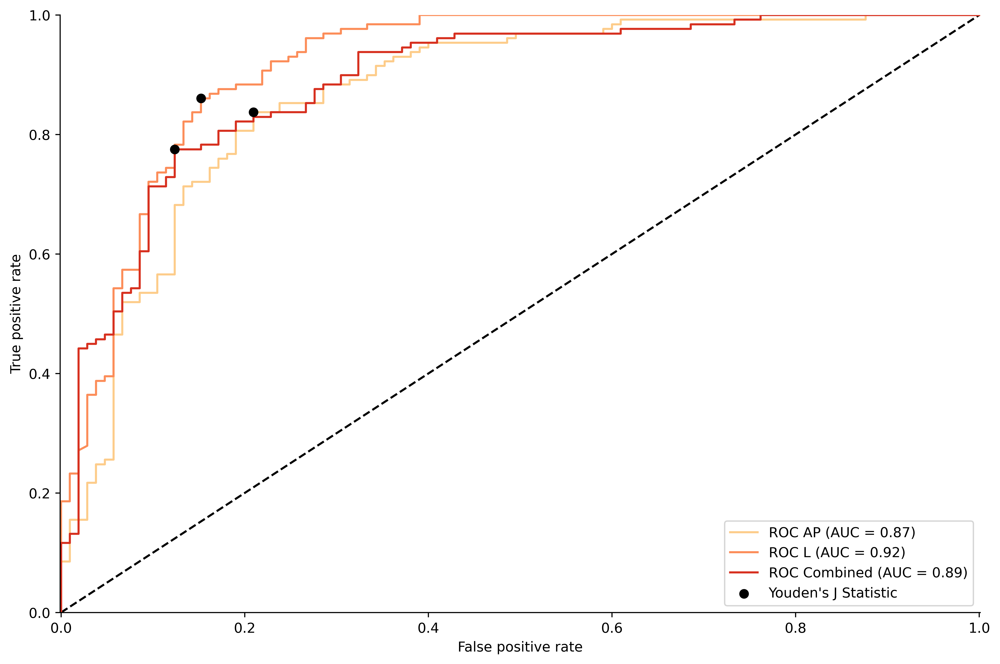

In [52]:
from PIL import Image
import io 
import matplotlib.pyplot as plt


fig = plt.figure(figsize=(12,8), dpi=500)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.xlim(-0.001, 1.001)
plt.ylim(0, 1.0001)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_ap, tpr_ap, label='ROC AP (AUC = {:.2f})'.format(auc_ap), color='#fdcc8a')
plt.plot(fpr_L, tpr_L, label='ROC L (AUC = {:.2f})'.format(auc_L), color='#fc8d59')
plt.plot(fpr_combined, tpr_combined, label='ROC Combined (AUC = {:.2f})'.format(auc_combined), color='#d7301f')
plt.scatter(fpr_ap[ix_ap], tpr_ap[ix_ap], color='black', label="Youden's J Statistic", zorder=10)
plt.scatter(fpr_L[ix_L], tpr_L[ix_L], color='black', zorder=10)
plt.scatter(fpr_combined[ix_combined], tpr_combined[ix_combined], color='black', zorder=10)

plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.legend(loc='best')
plt.show()

png1 = io.BytesIO()
fig.savefig(png1, format='png')

png2 = Image.open(png1)

png2.save("AUROC.tiff")
png1.close()


In [53]:
def youden_threshold(y_pred, thresholdArr, youden_ix):
  pred = np.array(y_pred)
  for i in range(np.shape(pred)[0]):
    if pred[i] > thresholdArr[youden_ix]:
      pred[i] = 1
    else:
      pred[i] = 0
  return pred

In [54]:
y_pred_ap_youden = youden_threshold(y_pred_ap, thresholds_ap, ix_ap)
y_pred_L_youden = youden_threshold(y_pred_L, thresholds_L, ix_L)
y_pred_combined_youden = youden_threshold(y_pred, thresholds_combined, ix_combined)


In [55]:
from random import choices

bootstrap_len = 2000

def performanceMetrics(pred, gt):
  tn, fp, fn, tp = confusion_matrix(gt, pred).ravel()
  accuracy = accuracy_score(gt, pred)
  specificity = tn/(tn+fp)
  sensitivity = recall_score(gt, pred)
  ppv = tp / (tp + fp)
  npv = tn / (tn + fn)

  return accuracy, specificity, sensitivity, ppv, npv

def aucs(pred, gt):
  auroc = roc_auc_score(gt, pred)
  ap = average_precision_score(gt, pred)
  return auroc, ap

def sample_with_replacement(pred, gt):
  index = list(range(0, np.shape(pred)[0]-1))
  sampled_index = choices(index, k=np.shape(pred)[0])
  sampled_pred = pred[sampled_index]
  sampled_gt = gt[sampled_index]

  return sampled_pred, sampled_gt

auc_ap_Arr, ap_ap_Arr, accuracy_ap_Arr, specificity_ap_Arr, sensitivity_ap_Arr, ppv_ap_Arr, npv_ap_Arr = [],[],[],[],[], [], []
auc_L_Arr, ap_L_Arr, accuracy_L_Arr, specificity_L_Arr, sensitivity_L_Arr, ppv_L_Arr, npv_L_Arr = [],[],[],[],[], [],[]
auc_combined_Arr, ap_combined_Arr, accuracy_combined_Arr, specificity_combined_Arr, sensitivity_combined_Arr, ppv_combined_Arr, npv_combined_Arr = [],[],[],[],[],[],[]

for i in range(bootstrap_len):
  sampled_ap, sampled_ap_gt = sample_with_replacement(y_pred_ap_youden, y_test_ap)
  sampled_L, sampled_L_gt = sample_with_replacement(y_pred_L_youden, y_test_L)
  sampled_combined, sampled_combined_gt = sample_with_replacement(y_pred_combined_youden, y_test_combined)


  accuracy_ap, specificity_ap, sensitivity_ap, ppv_ap, npv_ap = performanceMetrics(sampled_ap, sampled_ap_gt)
  accuracy_L, specificity_L, sensitivity_L, ppv_L, npv_L = performanceMetrics(sampled_L, sampled_L_gt)
  accuracy_combined, specificity_combined, sensitivity_combined, ppv_combined, npv_combined = performanceMetrics(sampled_combined, sampled_combined_gt)

  accuracy_ap_Arr.append(accuracy_ap) 
  specificity_ap_Arr.append(specificity_ap)
  sensitivity_ap_Arr.append(sensitivity_ap)
  ppv_ap_Arr.append(ppv_ap)
  npv_ap_Arr.append(npv_ap)

  accuracy_L_Arr.append(accuracy_L) 
  specificity_L_Arr.append(specificity_L)
  sensitivity_L_Arr.append(sensitivity_L)
  ppv_L_Arr.append(ppv_L)
  npv_L_Arr.append(npv_L)

  accuracy_combined_Arr.append(accuracy_combined) 
  specificity_combined_Arr.append(specificity_combined)
  sensitivity_combined_Arr.append(sensitivity_combined)
  ppv_combined_Arr.append(ppv_combined)
  npv_combined_Arr.append(npv_combined)

  sampled_ap, sampled_ap_gt = sample_with_replacement(y_pred_ap, y_test_ap)
  sampled_L, sampled_L_gt = sample_with_replacement(y_pred_L, y_test_L)
  sampled_combined, sampled_combined_gt = sample_with_replacement(y_pred, y_test_combined)

  auc_ap, ap_ap = aucs(sampled_ap, sampled_ap_gt)
  auc_L, ap_L = aucs(sampled_L, sampled_L_gt)
  auc_combined, ap_combined = aucs(sampled_combined, sampled_combined_gt)

  auc_ap_Arr.append(auc_ap)
  ap_ap_Arr.append(ap_ap)

  auc_L_Arr.append(auc_L)
  ap_L_Arr.append(ap_L)

  auc_combined_Arr.append(auc_combined)
  ap_combined_Arr.append(ap_combined)
  


In [56]:
from scipy import stats

def mean_confidence_interval(sample, confidence=0.95):
    n = sample.count()
    stdev = sample.std()
    test_stat = stats.norm.ppf((confidence + 1)/2)
    ci = test_stat * stdev 
    return np.mean(sample), "(" + str(np.mean(sample) - ci) + " , " + str(np.mean(sample) + ci ) + " )"

In [57]:
tn_ap, fp_ap, fn_ap, tp_ap = confusion_matrix(y_test_ap, y_pred_ap_youden).ravel()
tn_L, fp_L, fn_L, tp_L = confusion_matrix(y_test_L, y_pred_L_youden ).ravel()
tn, fp, fn, tp = confusion_matrix(y_test_combined, y_pred_combined_youden).ravel()

print("PERFORMANCE METRICS AT YOUDEN INDEX (95 % Confidence Intervals)")

#Accuracy
print(" ---------------------------------- ")
print("Accuracy Scores")
print("Accuracy AP: ", mean_confidence_interval(pd.Series(accuracy_ap_Arr)))
print("Accuracy L: " , mean_confidence_interval(pd.Series(accuracy_L_Arr)))
print("Accuracy Combined: ", mean_confidence_interval(pd.Series(accuracy_combined_Arr)))

#Specificity
print(" ---------------------------------- ")
print("Specificity Scores")
print("Specificity AP: ",  mean_confidence_interval(pd.Series(specificity_ap_Arr)))
print("Specificity L: " , mean_confidence_interval(pd.Series(specificity_L_Arr)))
print("Specificity Combined: ", mean_confidence_interval(pd.Series(specificity_combined_Arr)))

#Sensitivity Scores
print(" ---------------------------------- ")
print("Sensitivity Scores")
print("Sensitivity AP: ",  mean_confidence_interval(pd.Series(sensitivity_ap_Arr)))
print("Sensitivity L: " , mean_confidence_interval(pd.Series(sensitivity_L_Arr)))
print("Sensitivity Combined: ", mean_confidence_interval(pd.Series(sensitivity_combined_Arr)))

#PPV
print(" ---------------------------------- ")
print("PPV Scores")
print("PPV AP: ", mean_confidence_interval(pd.Series(ppv_ap_Arr)))
print("PPV L: " , mean_confidence_interval(pd.Series(ppv_L_Arr)))
print("PPV Combined: ", mean_confidence_interval(pd.Series(ppv_combined_Arr)))

#NPV
print(" ---------------------------------- ")
print("NPV Scores")
print("NPV AP: ",  mean_confidence_interval(pd.Series(npv_ap_Arr)))
print("NPV L: " , mean_confidence_interval(pd.Series(npv_L_Arr)))
print("NPV Combined: ", mean_confidence_interval(pd.Series(npv_combined_Arr)))


#AUROC
print(" ---------------------------------- ")
print("AUROC Scores")
print("AUROC AP: ",  mean_confidence_interval(pd.Series(auc_ap_Arr)))
print("AUROC L: " , mean_confidence_interval(pd.Series(auc_L_Arr)))
print("AUROC Combined: ", mean_confidence_interval(pd.Series(auc_combined_Arr)))


#AUPRC
print(" ---------------------------------- ")
print("AUPRC Scores")
print("AUPRC AP: ",  mean_confidence_interval(pd.Series(ap_ap_Arr)))
print("AUPRC L: " , mean_confidence_interval(pd.Series(ap_L_Arr)))
print("AUPRC Combined: ", mean_confidence_interval(pd.Series(ap_combined_Arr)))


#F1-Score
print(" ---------------------------------- ")
print("F1 Scores")
print("F1 AP: ", f1_score(y_test_ap, y_pred_ap_youden))
print("F1 L: " , f1_score(y_test_L, y_pred_L_youden ))
print("F1 Combined: ", f1_score(y_test_combined, y_pred_combined_youden))

#Precision Scores
print(" ---------------------------------- ")
print("Precision Scores")
print("Precision AP: ", precision_score(y_test_ap, y_pred_ap_youden))
print("Precision L: " , precision_score(y_test_L, y_pred_L_youden ))
print("Precision Combined: ", precision_score(y_test_combined, y_pred_combined_youden))


PERFORMANCE METRICS AT YOUDEN INDEX (95 % Confidence Intervals)
 ---------------------------------- 
Accuracy Scores
Accuracy AP:  (0.8109679487179513, '(0.7623437429836329 , 0.8595921544522697 )')
Accuracy L:  (0.8496410256410265, '(0.8036800703101323 , 0.8956019809719207 )')
Accuracy Combined:  (0.8155106837606878, '(0.766604755635918 , 0.8644166118854576 )')
 ---------------------------------- 
Specificity Scores
Specificity AP:  (0.7911018467014069, '(0.7159646146522761 , 0.8662390787505377 )')
Specificity L:  (0.8474529440944043, '(0.779222899677415 , 0.9156829885113936 )')
Specificity Combined:  (0.8766999020480979, '(0.8152325302384181 , 0.9381672738577777 )')
 ---------------------------------- 
Sensitivity Scores
Sensitivity AP:  (0.827333818899249, '(0.7618948766098018 , 0.8927727611886961 )')
Sensitivity L:  (0.8513638329611715, '(0.7893474941765649 , 0.913380171745778 )')
Sensitivity Combined:  (0.7651319477332483, '(0.6911186332655623 , 0.8391452622009343 )')
 ------------

In [64]:
precision_ap, recall_ap, thresholds_ap = precision_recall_curve(y_test_ap, y_pred_ap)

precision_L, recall_L, thresholds_L = precision_recall_curve(y_test_L, y_pred_L)

precision_combined, recall_combined, thresholds_combined = precision_recall_curve(y_test_combined, y_pred)

In [69]:
#Determine natural incidence rate
print(np.sum(y_test_ap)/len(y_test_ap))

0.5512820512820513


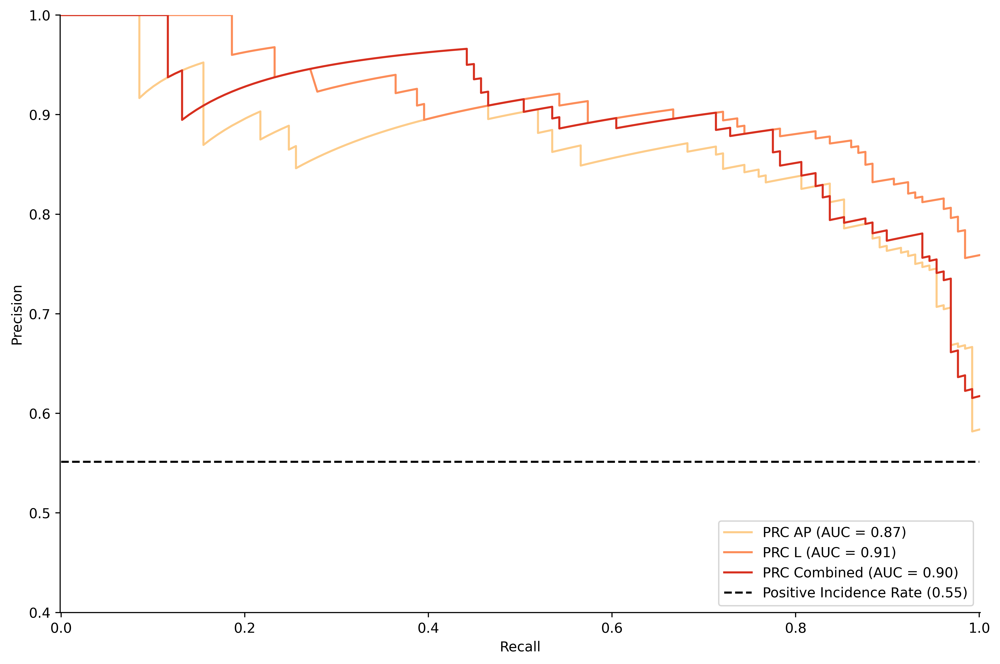

In [70]:
ap_ap = average_precision_score(y_test_ap, y_pred_ap)
ap_L =  average_precision_score(y_test_L, y_pred_L )
ap_combined =  average_precision_score(y_test_combined, y_pred)



fig = plt.figure(figsize=(12,8), dpi=500)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.xlim(-0.001, 1.001)
plt.ylim(0.4, 1.0001)

plt.plot(recall_ap, precision_ap, label='PRC AP (AUC = {:.2f})'.format(ap_ap), color='#fdcc8a')
plt.plot(recall_L, precision_L, label='PRC L (AUC = {:.2f})'.format(ap_L), color='#fc8d59')
plt.plot(recall_combined, precision_combined, label='PRC Combined (AUC = {:.2f})'.format(ap_combined), color='#d7301f')
plt.plot([0,1], [0.5512820512820513,0.5512820512820513], 'k--', label = 'Positive Incidence Rate (0.55)',)
plt.xlabel('Recall')
plt.ylabel('Precision')

plt.legend(loc='lower right')
plt.show()

png1 = io.BytesIO()
fig.savefig(png1, format='png')

png2 = Image.open(png1)

png2.save("AUPRC.tiff")
png1.close()


#Model Calibration Results


In [87]:
from sklearn.calibration import CalibratedClassifierCV, calibration_curve


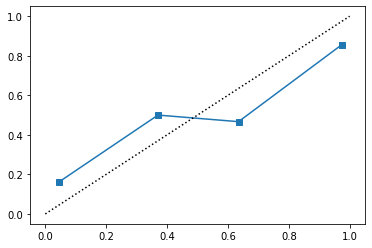

In [93]:
fraction_of_positives, mean_predicted_value = calibration_curve(y_test_combined, y_pred, n_bins=4)
plt.plot(mean_predicted_value, fraction_of_positives, "s-",)
plt.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")
plt.show()


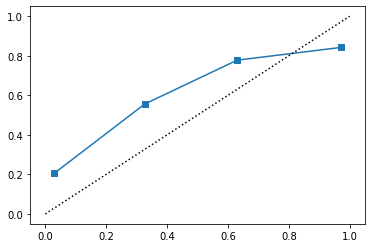

In [92]:
fraction_of_positives, mean_predicted_value = calibration_curve(y_test_ap, y_pred_ap, n_bins=4)
plt.plot(mean_predicted_value, fraction_of_positives, "s-",)
plt.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")
plt.show()



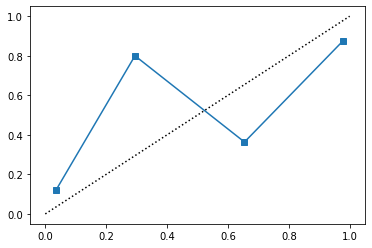

In [91]:
fraction_of_positives, mean_predicted_value = calibration_curve(y_test_L, y_pred_L, n_bins=4)
plt.plot(mean_predicted_value, fraction_of_positives, "s-",)
plt.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")
plt.show()

In [20]:
from google.colab import files
files.download("/content/AUPRC.tiff")
files.download("/content/AUROC.tiff")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Understand which images were misclassifed by the algorithm

In [84]:
#Determine which images were misclassifed by the algorithm 
misses = []
sum = 0
for i in range(np.shape(gts_ap)[0]):
  if y_pred_ap_youden[i] != gts_ap[i]:
    misses.append(i)
    # sum = sum +1

# print(sum)

0.0 1.0
1.0 0.0
1.0 0.0
0.0 1.0
1.0 0.0
1.0 0.0
0.0 1.0
1.0 0.0
0.0 1.0
1.0 0.0
0.0 1.0
0.0 1.0
0.0 1.0
1.0 0.0
0.0 1.0
1.0 0.0
1.0 0.0
0.0 1.0
1.0 0.0
1.0 0.0
1.0 0.0
0.0 1.0
1.0 0.0
0.0 1.0
0.0 1.0
1.0 0.0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


0.0 1.0
1.0 0.0
0.0 1.0
0.0 1.0
1.0 0.0
0.0 1.0
0.0 1.0
0.0 1.0
1.0 0.0
1.0 0.0
0.0 1.0
0.0 1.0
1.0 0.0
1.0 0.0
0.0 1.0
1.0 0.0
0.0 1.0
1.0 0.0


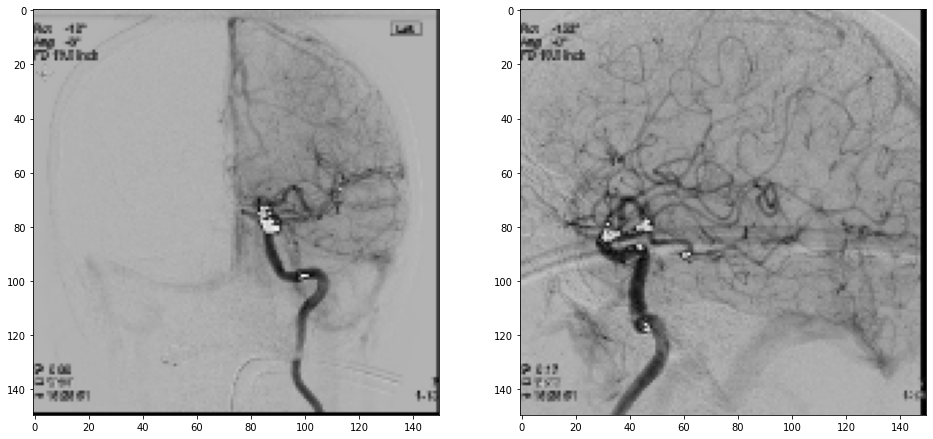

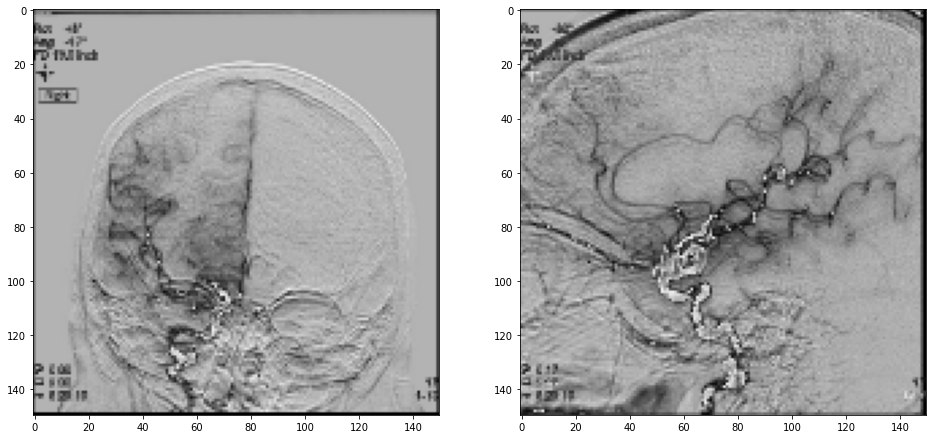

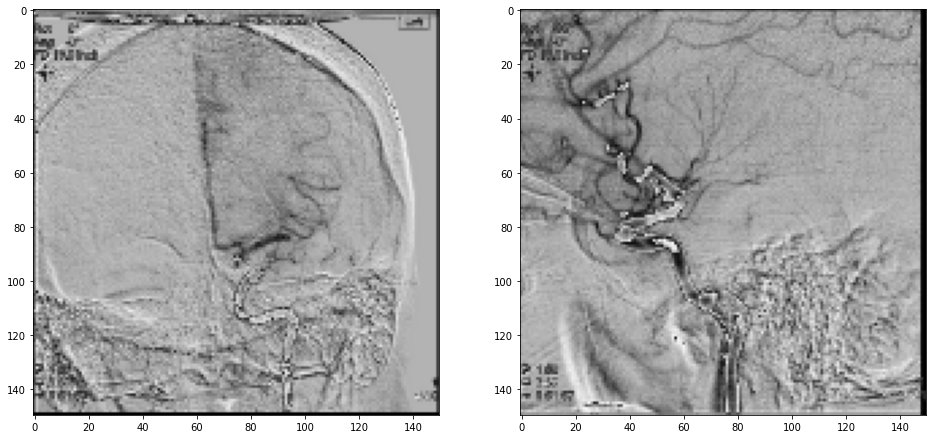

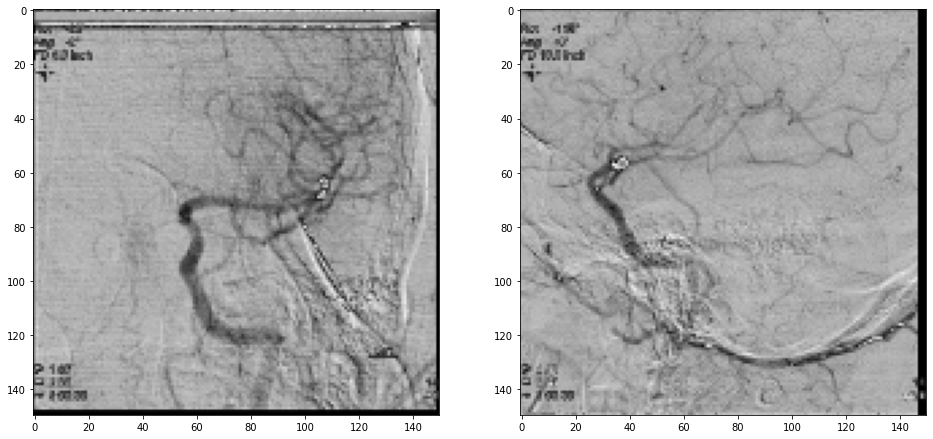

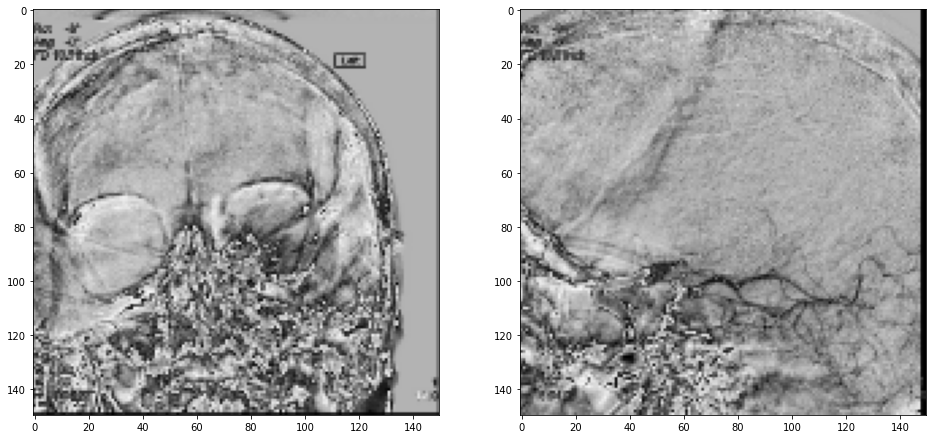

...

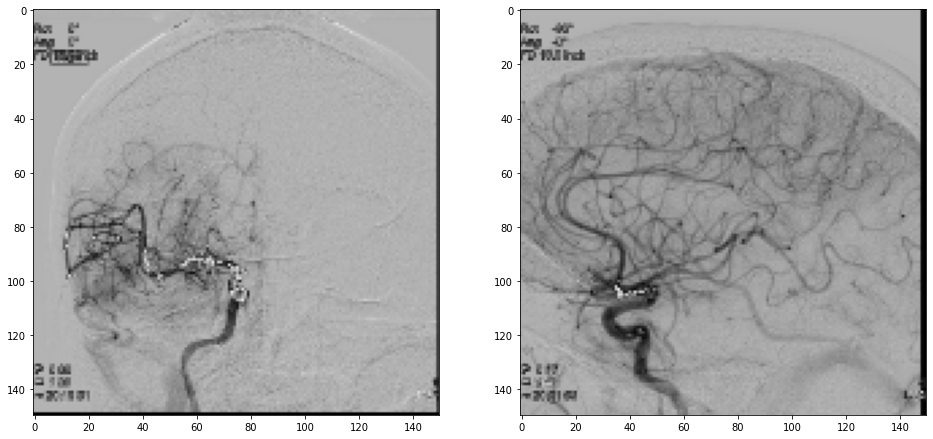

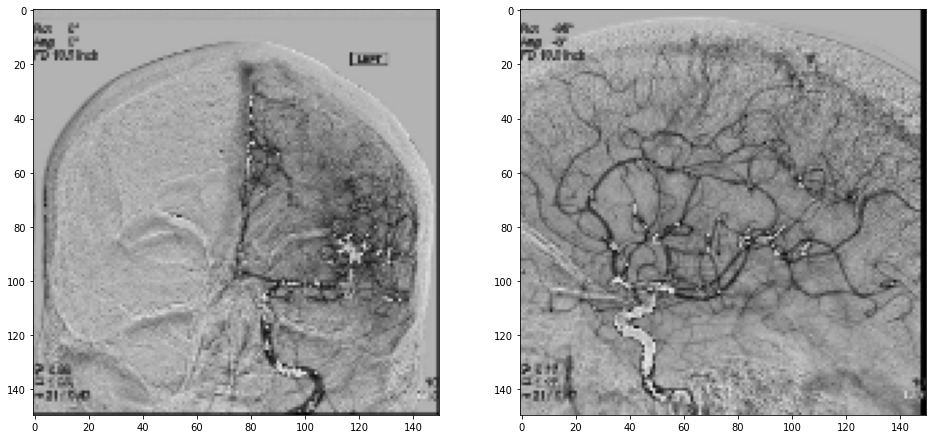

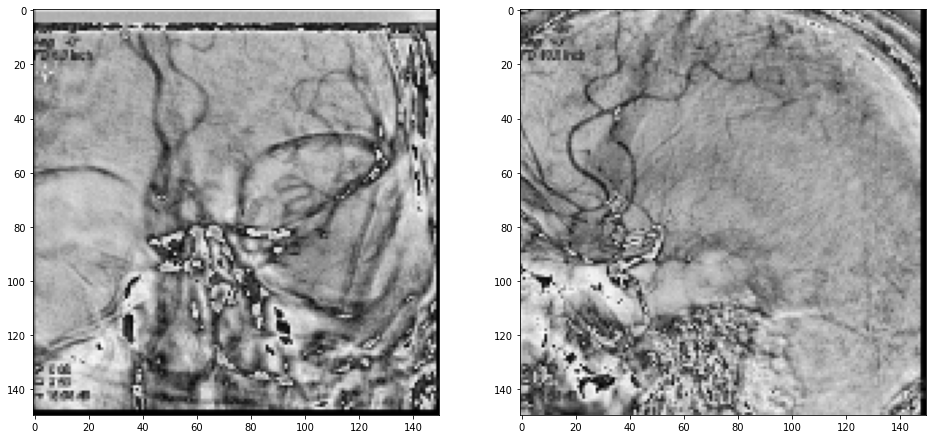

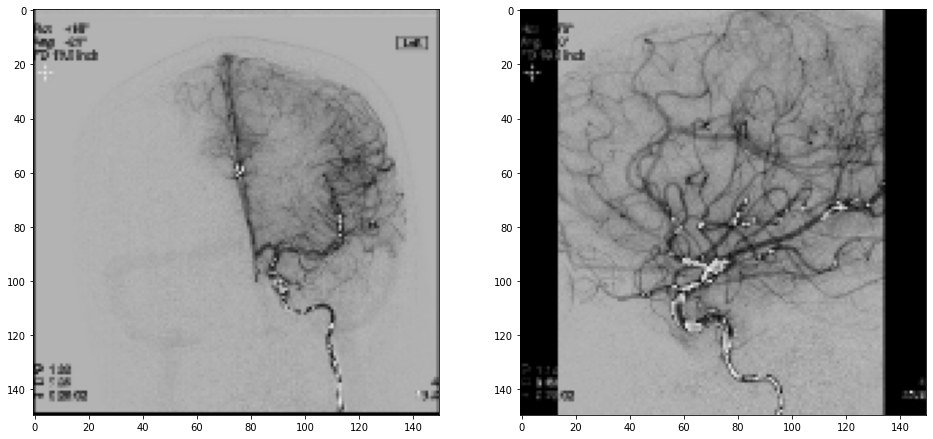

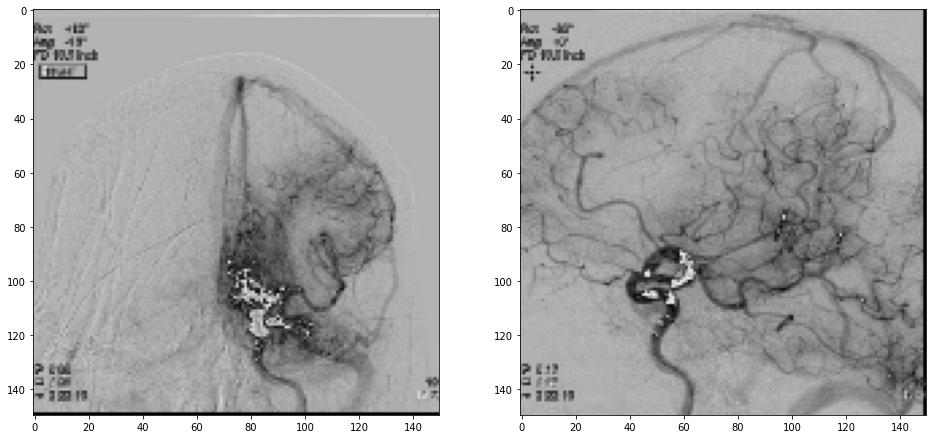

In [86]:
for index_of_miss in misses: 
  fig, ax = plt.subplots(ncols=2, figsize=(16,10))

  ap_miss = x_ap[index_of_miss]
  ax[0].imshow((ap_miss).astype(np.uint8))
  L_miss = x_L[index_of_miss]
  ax[1].imshow((L_miss).astype(np.uint8))
  print(y_pred_ap_youden[index_of_miss], gts_ap[index_of_miss])
